# Retrain The Model

In [1]:
# import the necessary packages
import matplotlib.pyplot as plt
%matplotlib inline

import seaborn as sns
import numpy as np
import geojson
import dask
import os
import uuid

import tensorflow as tf

from keras.models import load_model
from keras.layers import Dense, Dropout, Activation
from keras.models import Sequential
from keras.optimizers import Adam
from keras import regularizers
from keras.callbacks import ReduceLROnPlateau
from keras.callbacks import ModelCheckpoint
from keras.callbacks import Callback
from keras import backend as K

from keras.applications.vgg16 import VGG16
from keras.models import Input, Model
from keras.layers import Add, Conv2D, Conv2DTranspose

import cv2
import glob
import json
import numpy as np
import pandas as pd
import rasterio

from datetime import datetime
from functools import partial
from shapely.geometry import box, mapping
from sklearn.metrics import confusion_matrix, f1_score, precision_score, recall_score, accuracy_score
from sklearn.model_selection import train_test_split
from skimage import filters

# Instantiating an Interface object automatically logs you in to the GBDX platform
from gbdxtools.task import env
from gbdxtools import CatalogImage
from gbdxtools import Interface
gbdx = Interface()

Using TensorFlow backend.


# Preparing The Dataset To Retrain The Model

In [2]:
# path = '../../data/trainings_data_waterbodies/data_non_acomp_all_polygons_2020-03-26 12:37:01.698516.csv'
path = '/home/daffolap-851/Projects/GreenCityWatch/manual_inference_data_and_weights/pixel_based_training_data/user_output_3.csv'

# nr_search = path.split('/')[-1].split('_')[4]
# print(nr_search)

# nr_search

def prepare_the_training_dataset(pixel_training_dataset_path=None):
    # Reading the raw data into a Pandas DataFrame
    data_raw = pd.read_csv(path).drop(['x','y'], axis= 1)

    # First we rename the columns of our dataset 

    # Bands
    # coastal = data[0]
    # blue = data[1]
    # green = data[2]
    # yellow = data[3]
    # red = data[4]
    # red_edge = data[5]
    # nir1 = data[6]
    # nir2 = data[7]

        # select variables
    property_names = ['cloudCover',
                     'multiResolution',
                     'targetAzimuth',
                     # 'timestamp',
                     'sunAzimuth',
                     'offNadirAngle',
                     # 'platformName',
                     'sunElevation',
                     # 'scanDirection',
                     'panResolution']

    data_raw.columns = ['coastal','blue','green','yellow','red','red_edge','nir1','nir2',] + property_names  + ['label']

    # Here we will calculate the indices with the band data we already have

    data_raw['ndvi'] = (data_raw.nir1 - data_raw.red)/(data_raw.nir1 + data_raw.red)
    data_raw['ndwi'] = (data_raw.green - data_raw.nir1)/(data_raw.green + data_raw.nir1)

    data_raw['wwi'] = (data_raw.coastal-data_raw.nir2)/(data_raw.coastal+data_raw.nir2+10e-5)

    data_clean = data_raw


    all_variables = ['coastal','blue','green','yellow','red','red_edge','nir1','nir2',] + property_names + ['ndvi','ndwi', 'wwi']

    i = 0 
    for variable in all_variables:
        print(i, variable)
        i = i + 1

    variable_selection = range(17)

    all_variables = [all_variables[i] for i in variable_selection]

    data = data_clean[all_variables].values

    # Normalize training data to between 0 and 1
    try:
        min_data =  np.nanmin(data)
        max_data = np.nanmax(data)
        data = (data - min_data) / (max_data - min_data)
    except Exception as e:
        print(e)

        # check data 
    data_clean

    X = data 

    # Similarly, we can extract the labels
    y = data_clean['label'].values == 'water'

    X.shape

    # x_train, x_test, y_train, y_test = train_test_split(data, labels, test_size=0.2, random_state=0, shuffle=True, stratify=labels)

    # First split the data samples into training and validation sets
    X_train, X_validation, y_train, y_validation = train_test_split(X, y, test_size=0.3, random_state=42, stratify=y)

    print('')
    print('Training Data Shape: ', X_train.shape)   # Convert to 2-D tensor -> X_train[nb_samples, nb_channels]
    print('Training Data Dtype: ', X_train.dtype)
    print('Training Labels Shape: ', y_train.shape) # Convert to 1-D tensor -> y_train[nb_samples]
    print('Training Labels Dtype: ', y_train.dtype)

    # Second, split the the validation data into validation and testing sets
    X_validation, X_test, y_validation, y_test = train_test_split(X_validation, y_validation, test_size=0.33, random_state=42, stratify=y_validation)

    print('')
    print('Validation Data Shape: ',X_validation.shape)  # Convert to 2-D tensor -> X_validation[nb_samples, nb_channels]
    print('Validation Data Shape: ', X_validation.dtype)
    print('Validation Labels: ', y_validation.shape)     # Convert to 1-D tensor -> y_validation[nb_samples]
    print('Validation Labels: ', y_validation.dtype)

    print('')
    print('Test Data Shape: ',X_test.shape)  # Convert to 2-D tensor -> testData[nb_samples, nb_channels]
    print('Test Data Shape: ', X_test.dtype)
    print('Test Labels: ', y_test.shape)     # Convert to 1-D tensor -> testLabels[nb_samples]
    print('Test Labels: ', y_test.dtype)
    
    return X_train, X_validation, X_test, y_train, y_validation, y_test

# X_train, X_validation, X_test, y_train, y_validation, y_test = prepare_the_training_dataset(pixel_training_dataset_path=path)

In [3]:
# Create custom callback to terminate early if minimum learning rate 
# has been achieved or the maximum number of Epochs has been reached
class EarlyStoppingByLearningRate(Callback):
    def __init__(self, min_lr=0., max_epochs=100, verbose=0):
        super(Callback, self).__init__()
        self.min_lr = min_lr
        self.max_epochs = max_epochs
        self.verbose = verbose
        self.init_lr=0
        self.curr_lr=0
        self.decay=0
        self.iterations=0

    def on_epoch_end(self, epoch, logs={}):
        self.init_lr = K.get_value(self.model.optimizer.lr)
        self.decay = K.get_value(self.model.optimizer.decay)
        self.iterations = K.get_value(self.model.optimizer.iterations)
        self.curr_lr = self.init_lr * (1. / (1. + self.decay * self.iterations))

        if self.curr_lr < self.min_lr or epoch == self.max_epochs:
            if self.verbose > 0:
                print("The current LR = {0:10.8f} at Epoch = {1:05d}".format(self.curr_lr, epoch))
            self.model.stop_training = True

# Retraining the model

In [7]:
def retrain_the_model(X_train, X_validation, X_test, y_train, y_validation, y_test, pre_trained_model_weight=None, output_path_to_save_model=None):
    # Specify the list of training 'batch' sizes
    batch_sizes = [200] # [200, 300, 400, 500] # [100]
    n_samples, dimensions= X_train.shape

    verbose = 1

    for (cnt, batch_size) in enumerate(batch_sizes):

        print("Training the water-land classes predictive model ...")

        # Load our MLP binary classifier model
        model = load_model(pre_trained_model_weight) # create_baseline2(800, 800, transfer_learning = True, l_r = 0.0001)
        
        # Compile model
        opt = Adam(decay=0.000005)
        model.compile(loss='binary_crossentropy', optimizer=opt, metrics=['accuracy'])

        # Specify the minimum learning rate, the maximum number of epochs, and the batch size
        min_learning_rate = 0.000001
        max_epochs = 200

        # Use reduce learning rate if validation loss plateaus
        reduce_lr = ReduceLROnPlateau(monitor='val_loss', 
                                      verbose=verbose,
                                      factor=0.1,
                                      patience=25,
                                      min_lr=min_learning_rate)

        # Use checkpointer callback to save the model everytime the validation accuracy increases
        unique_id = str(uuid.uuid4().hex)[-4:]
        print(unique_id)
        weights = output_path_to_save_model \
                    + '/' \
                    + unique_id \
                    + '_' \
                    +'batchSize_' \
                    + str(batch_size) \
                    + '_Epoch-{epoch:05d}-Val_acc-{accuracy:.5f}_' \
                    + 'weights.hdf5'
        print(weights)
        checkpointer = ModelCheckpoint(weights, 
                                       monitor='accuracy', 
                                       verbose=verbose,
                                       save_best_only=True,
                                       mode='max')

        # Early stopping by learning rate callback
        earlyStop = EarlyStoppingByLearningRate(min_lr=min_learning_rate, 
                                                max_epochs=max_epochs,
                                                verbose=verbose)

        # Create list of all of the callbacks
        callbacks_list = [reduce_lr, checkpointer, earlyStop]

        history = model.fit(X_train, 
                            y_train,
                            batch_size=batch_size,
                            epochs=max_epochs, 
                            callbacks=callbacks_list,
                            shuffle=True,
                            validation_data=(X_validation, y_validation))

        # Evaluate and display the accuracy using the test data
        loss, accuracy = model.evaluate(X_test, y_test, batch_size=batch_size, verbose=verbose)

        # Output the loss and accuracy on the held-out testing set
        print()
        print("Test loss: {:.4f}%".format(loss))
        print("Test accuracy: {:.4f}%".format(accuracy * 100))

        # List all data in history
        print(history.history.keys())
        
    # List all data in history
    print(history.history.keys())

    # Summarize history for accuracy
    plt.plot(history.history['accuracy'])
    plt.plot(history.history['val_accuracy'])
    plt.title('Model Accuracy')
    plt.ylabel('Accuracy')
    plt.xlabel('Epoch')
    plt.legend(['train', 'validate'], loc='upper left')
    plt.draw()
    plt.show()
    plt.pause(1)    

    # Summarize history for loss
    plt.plot(history.history['loss'])
    plt.plot(history.history['val_loss'])
    plt.title('Model Loss')
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.legend(['train', 'validate'], loc='upper left')
    plt.draw()
    plt.show()
    plt.pause(1)
    
    y_pred = model.predict(X_test)
    
    sns.kdeplot(y_pred.flatten(),cut=0);
    thresh = filters.threshold_otsu(y_pred)
    plt.axvline(thresh, color='k', ls='--');
    plt.draw()
    plt.show()
    
    print('Otsu Threshold:', thresh)
    print('Precision Score:', precision_score(y_test, y_pred>thresh))
    print('Recall Score:', recall_score(y_test, y_pred > thresh))
    print('F1-Score:', f1_score(y_test, y_pred > thresh))
    accuracy = accuracy_score(y_test, y_pred > thresh)
    print('Accuracy:', accuracy)
    return accuracy

pre_trained_model_weight = '/home/daffolap-851/Projects/GreenCityWatch/manual_inference_data_and_weights/pre_trained_model_weights/bfalg_batchSize_200_Epoch-00185-Val_acc-0.95145_weights.hdf5'
output_path_to_save_model = '/home/daffolap-851/Projects/GreenCityWatch/manual_inference_data_and_weights/model_weight'
# retrain_the_model(pre_trained_model_weight, output_path_to_save_model)

Enter the model weight path
/home/daffolap-851/Projects/GreenCityWatch/manual_inference_data_and_weights/pre_trained_model_weights/bfalg_batchSize_200_Epoch-00185-Val_acc-0.95145_weights.hdf5
Enter the path containing the input tif files
/home/daffolap-851/Projects/GreenCityWatch/manual_inference_data_and_weights/img_data_to_combine/*.tif
Enter the path to store the inference tif files
/home/daffolap-851/Projects/GreenCityWatch/manual_inference_data_and_weights/raster_classifications/
/home/daffolap-851/Projects/GreenCityWatch/manual_inference_data_and_weights/img_data_to_combine/Setu_mangga_bolong_2019-05-31_03_28_104001004CBD1F00.tif
3545718/3545718 [==============================] - 28s 8us/step


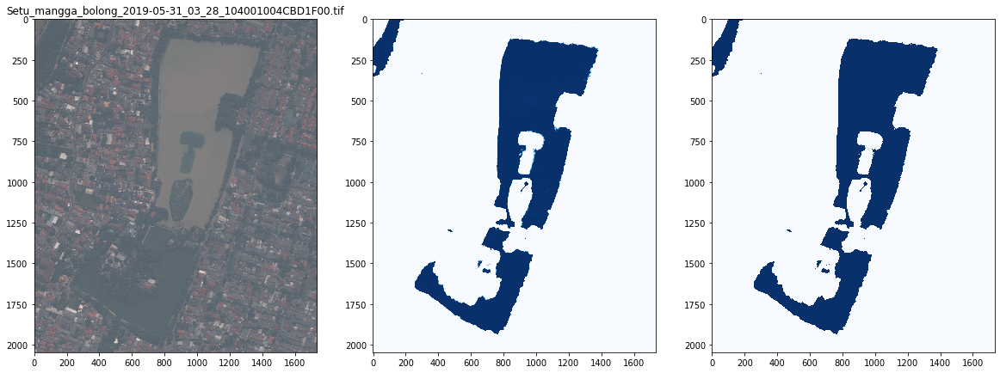

saved as:  /home/daffolap-851/Projects/GreenCityWatch/manual_inference_data_and_weights/raster_classifications/classification_Setu_mangga_bolong_2019-05-31_03_28_104001004CBD1F00.tif
/home/daffolap-851/Projects/GreenCityWatch/manual_inference_data_and_weights/img_data_to_combine/Setu_rawa_babon_2019-07-27_03_34_10400100503B3A00.tif
3036682/3036682 [==============================] - 24s 8us/step


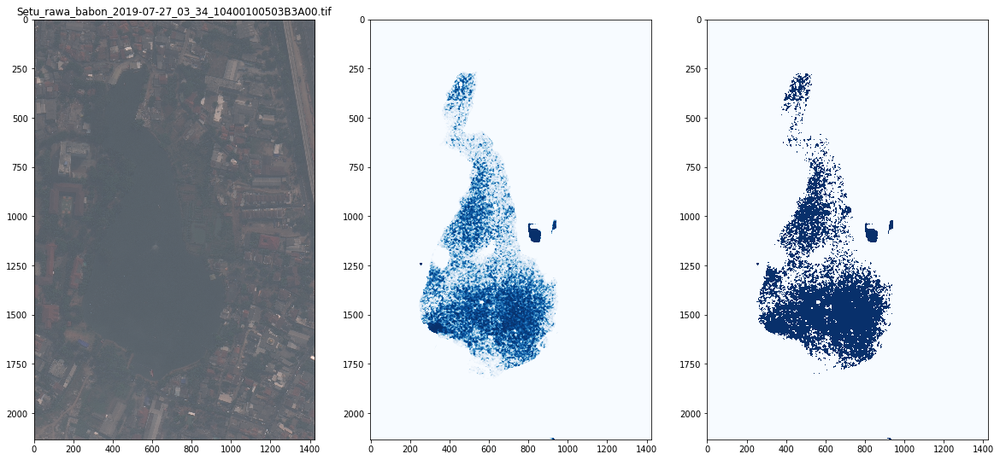

saved as:  /home/daffolap-851/Projects/GreenCityWatch/manual_inference_data_and_weights/raster_classifications/classification_Setu_rawa_babon_2019-07-27_03_34_10400100503B3A00.tif
/home/daffolap-851/Projects/GreenCityWatch/manual_inference_data_and_weights/img_data_to_combine/Setu_Babakan_S_2019-05-31_03_28_104001004CBD1F00.tif
2146013/2146013 [==============================] - 16s 8us/step


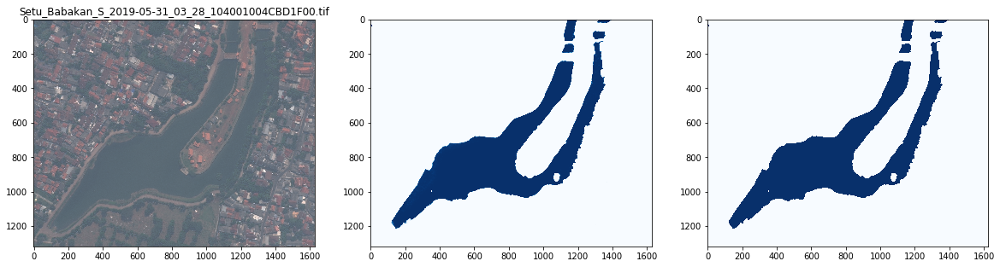

saved as:  /home/daffolap-851/Projects/GreenCityWatch/manual_inference_data_and_weights/raster_classifications/classification_Setu_Babakan_S_2019-05-31_03_28_104001004CBD1F00.tif
['/home/daffolap-851/Projects/GreenCityWatch/manual_inference_data_and_weights/raster_classifications/classification_Setu_Babakan_S_2019-05-31_03_28_104001004CBD1F00.tif', '/home/daffolap-851/Projects/GreenCityWatch/manual_inference_data_and_weights/raster_classifications/classification_Setu_rawa_indah_2018-09-13_03_30_1030010085B5FC00.tif', '/home/daffolap-851/Projects/GreenCityWatch/manual_inference_data_and_weights/raster_classifications/classification_Setu_mangga_bolong_2019-05-31_03_28_104001004CBD1F00.tif', '/home/daffolap-851/Projects/GreenCityWatch/manual_inference_data_and_weights/raster_classifications/classification_Setu_Babakan_N_2019-05-31_03_28_104001004CBD1F00.tif', '/home/daffolap-851/Projects/GreenCityWatch/manual_inference_data_and_weights/raster_classifications/classification_Setu_rawa_babon

/home/daffolap-851/.conda/envs/green_city_watch_dev/lib/python3.6/site-packages/ipykernel_launcher.py:48: UserWarning: Any labeled images will be returned as a boolean array. Did you mean to use a boolean array?


(2621, 2819)


/home/daffolap-851/.conda/envs/green_city_watch_dev/lib/python3.6/site-packages/pyproj/crs.py:77: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method.
  return _prepare_from_string(" ".join(pjargs))


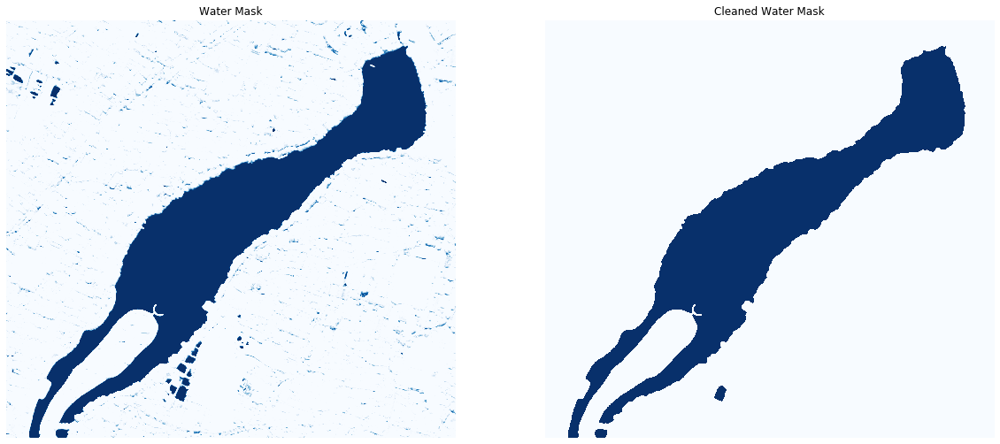

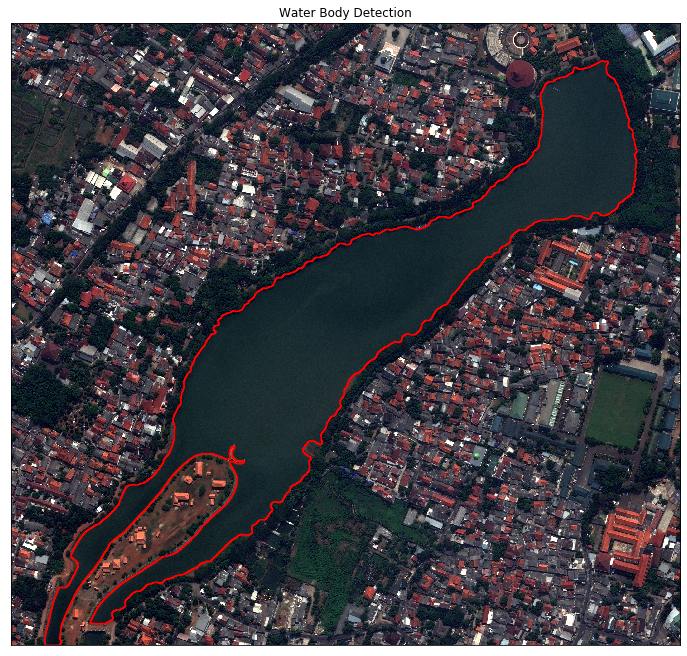

Is it water?: y/n
y


/home/daffolap-851/.conda/envs/green_city_watch_dev/lib/python3.6/site-packages/pyproj/crs.py:77: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method.
  return _prepare_from_string(" ".join(pjargs))
/home/daffolap-851/.conda/envs/green_city_watch_dev/lib/python3.6/site-packages/pyproj/crs.py:77: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method.
  return _prepare_from_string(" ".join(pjargs))
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


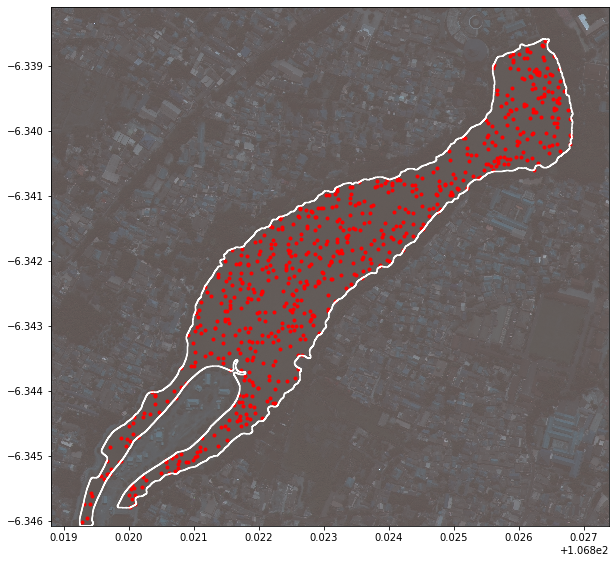

/home/daffolap-851/.conda/envs/green_city_watch_dev/lib/python3.6/site-packages/pyproj/crs.py:77: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method.
  return _prepare_from_string(" ".join(pjargs))


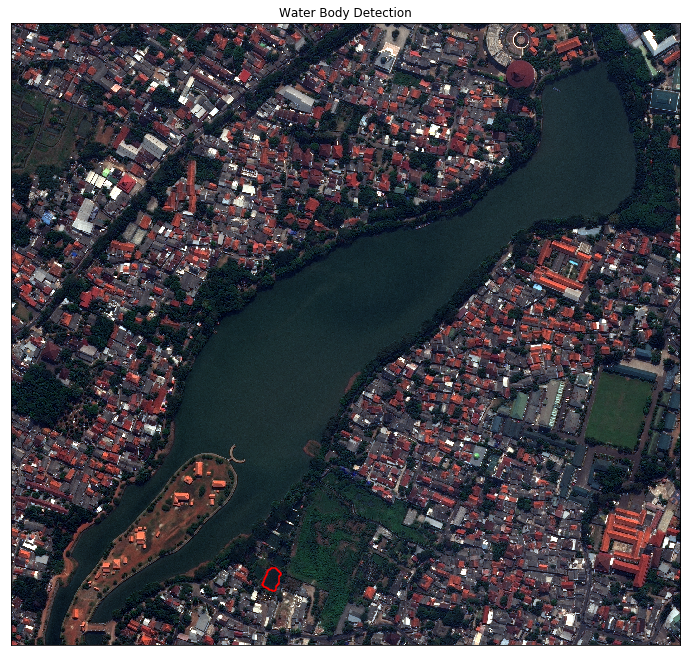

Is it water?: y/n
n


/home/daffolap-851/.conda/envs/green_city_watch_dev/lib/python3.6/site-packages/pyproj/crs.py:77: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method.
  return _prepare_from_string(" ".join(pjargs))
/home/daffolap-851/.conda/envs/green_city_watch_dev/lib/python3.6/site-packages/pyproj/crs.py:77: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method.
  return _prepare_from_string(" ".join(pjargs))
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


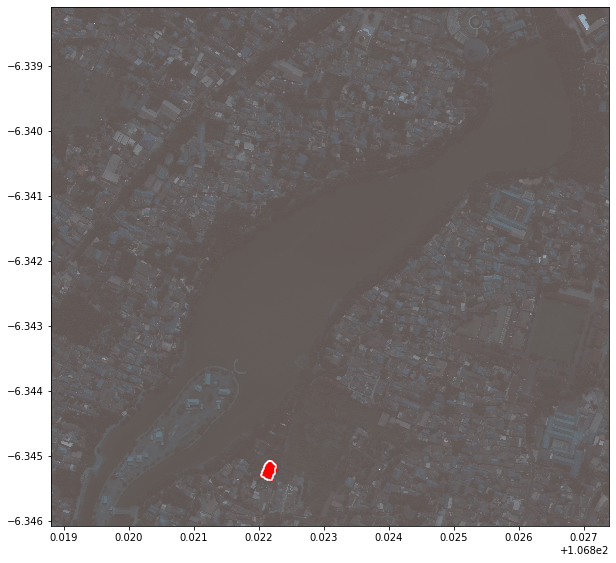

/home/daffolap-851/.conda/envs/green_city_watch_dev/lib/python3.6/site-packages/pyproj/crs.py:77: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method.
  return _prepare_from_string(" ".join(pjargs))


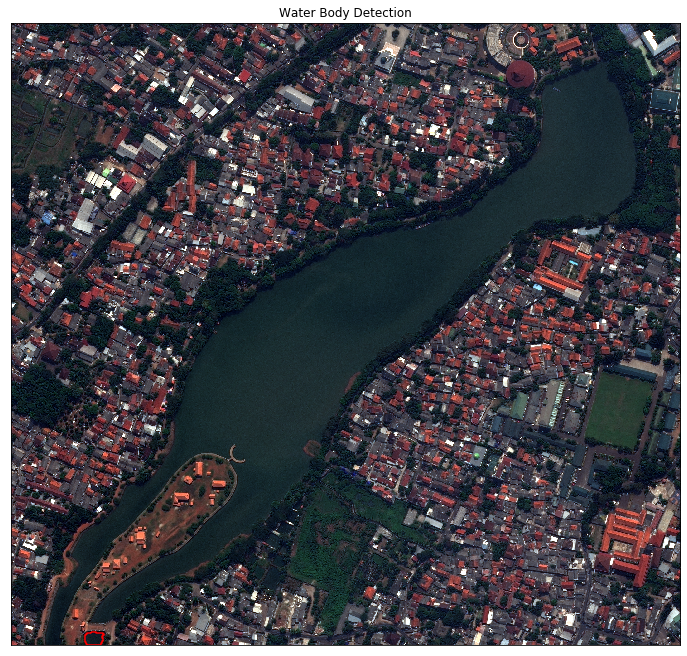

Is it water?: y/n
y


/home/daffolap-851/.conda/envs/green_city_watch_dev/lib/python3.6/site-packages/pyproj/crs.py:77: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method.
  return _prepare_from_string(" ".join(pjargs))
/home/daffolap-851/.conda/envs/green_city_watch_dev/lib/python3.6/site-packages/pyproj/crs.py:77: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method.
  return _prepare_from_string(" ".join(pjargs))
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


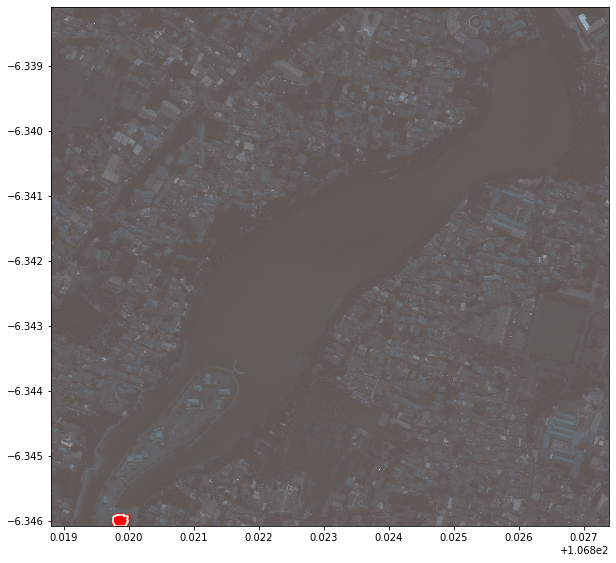


500.0 sq. m
3125 grid cells
(1167, 1167)


/home/daffolap-851/.conda/envs/green_city_watch_dev/lib/python3.6/site-packages/ipykernel_launcher.py:48: UserWarning: Any labeled images will be returned as a boolean array. Did you mean to use a boolean array?
/home/daffolap-851/.conda/envs/green_city_watch_dev/lib/python3.6/site-packages/pyproj/crs.py:77: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method.
  return _prepare_from_string(" ".join(pjargs))


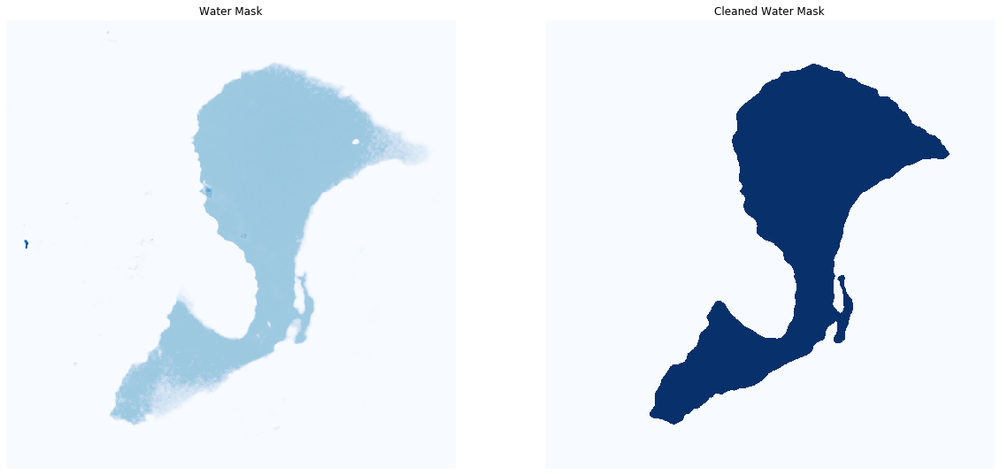

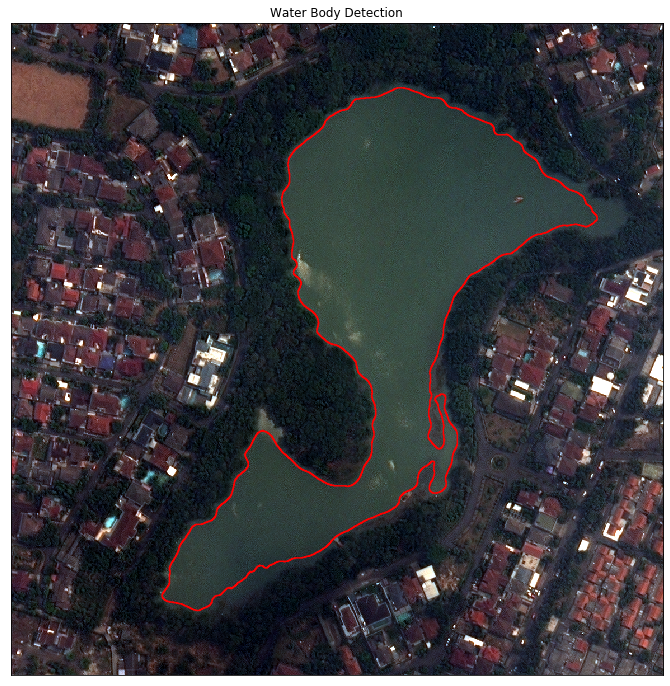

Is it water?: y/n
y


/home/daffolap-851/.conda/envs/green_city_watch_dev/lib/python3.6/site-packages/pyproj/crs.py:77: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method.
  return _prepare_from_string(" ".join(pjargs))
/home/daffolap-851/.conda/envs/green_city_watch_dev/lib/python3.6/site-packages/pyproj/crs.py:77: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method.
  return _prepare_from_string(" ".join(pjargs))
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


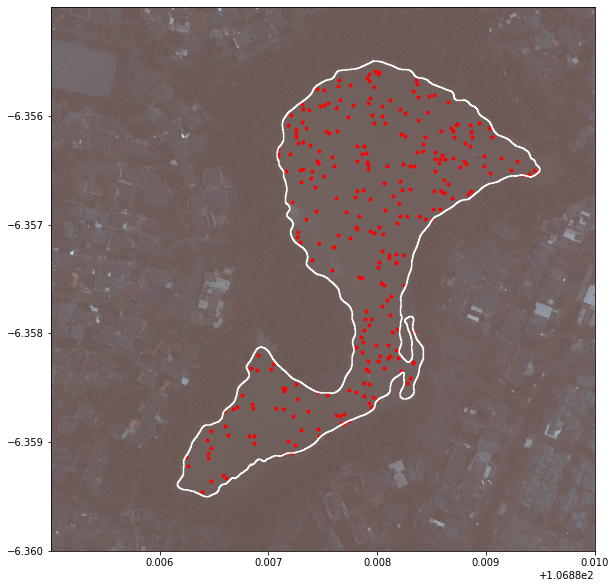


500.0 sq. m
3125 grid cells
(2134, 1423)


/home/daffolap-851/.conda/envs/green_city_watch_dev/lib/python3.6/site-packages/ipykernel_launcher.py:48: UserWarning: Any labeled images will be returned as a boolean array. Did you mean to use a boolean array?
/home/daffolap-851/.conda/envs/green_city_watch_dev/lib/python3.6/site-packages/pyproj/crs.py:77: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method.
  return _prepare_from_string(" ".join(pjargs))


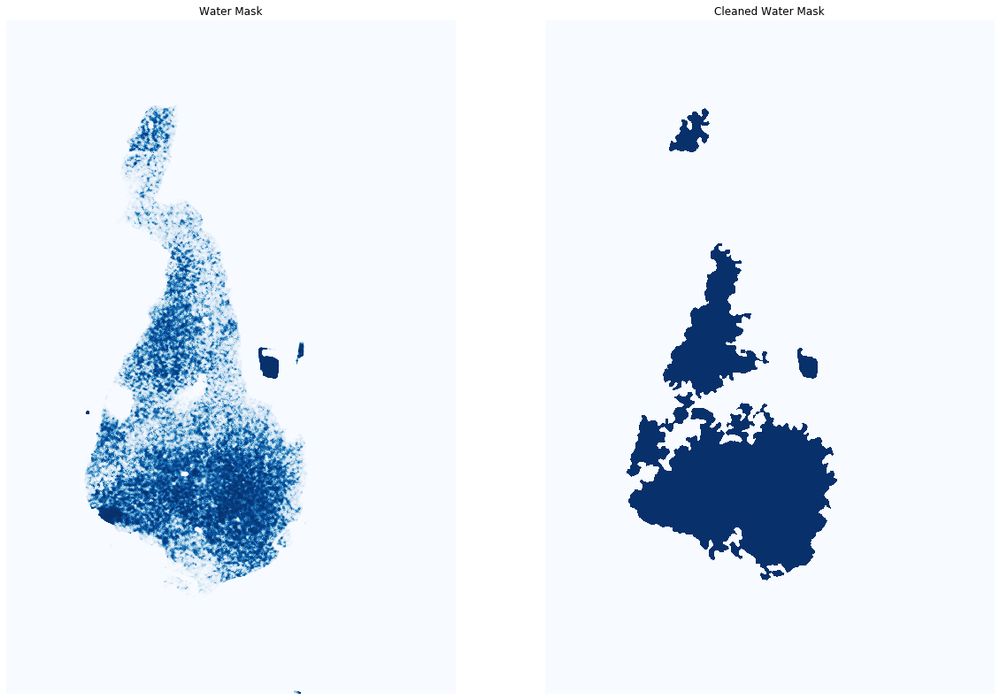

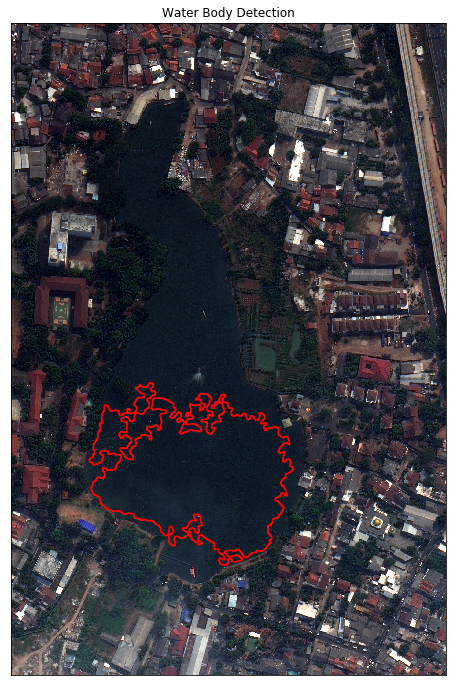

Is it water?: y/n
y


/home/daffolap-851/.conda/envs/green_city_watch_dev/lib/python3.6/site-packages/pyproj/crs.py:77: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method.
  return _prepare_from_string(" ".join(pjargs))
/home/daffolap-851/.conda/envs/green_city_watch_dev/lib/python3.6/site-packages/pyproj/crs.py:77: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method.
  return _prepare_from_string(" ".join(pjargs))
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


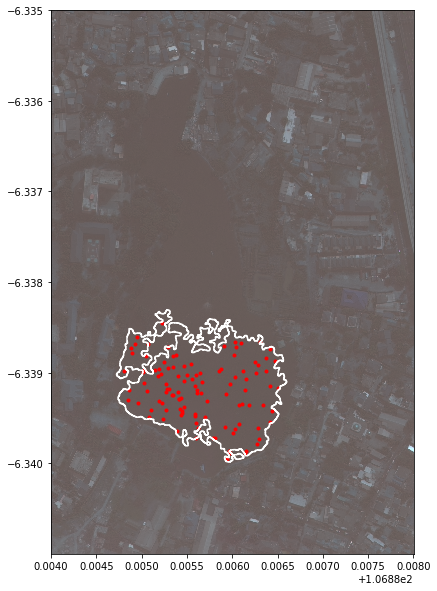

/home/daffolap-851/.conda/envs/green_city_watch_dev/lib/python3.6/site-packages/pyproj/crs.py:77: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method.
  return _prepare_from_string(" ".join(pjargs))


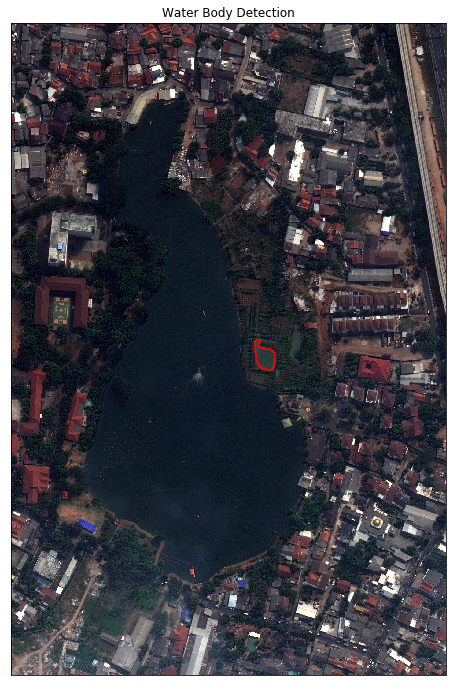

Is it water?: y/n
n


/home/daffolap-851/.conda/envs/green_city_watch_dev/lib/python3.6/site-packages/pyproj/crs.py:77: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method.
  return _prepare_from_string(" ".join(pjargs))
/home/daffolap-851/.conda/envs/green_city_watch_dev/lib/python3.6/site-packages/pyproj/crs.py:77: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method.
  return _prepare_from_string(" ".join(pjargs))
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


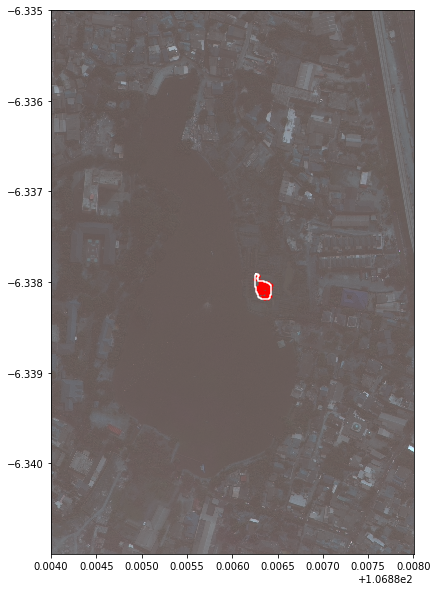

/home/daffolap-851/.conda/envs/green_city_watch_dev/lib/python3.6/site-packages/pyproj/crs.py:77: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method.
  return _prepare_from_string(" ".join(pjargs))


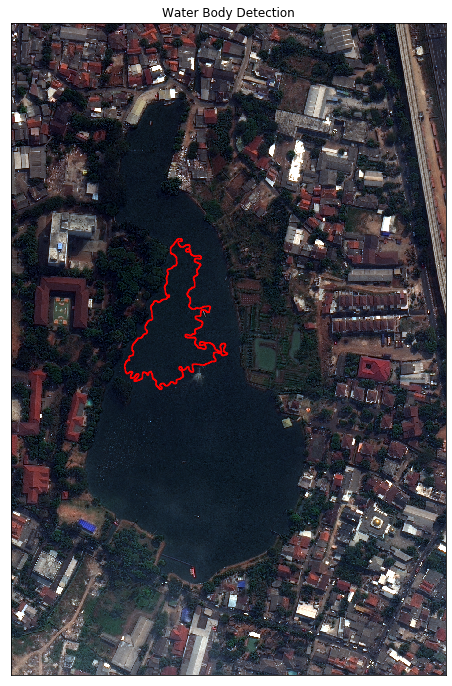

Is it water?: y/n
y


/home/daffolap-851/.conda/envs/green_city_watch_dev/lib/python3.6/site-packages/pyproj/crs.py:77: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method.
  return _prepare_from_string(" ".join(pjargs))
/home/daffolap-851/.conda/envs/green_city_watch_dev/lib/python3.6/site-packages/pyproj/crs.py:77: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method.
  return _prepare_from_string(" ".join(pjargs))
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


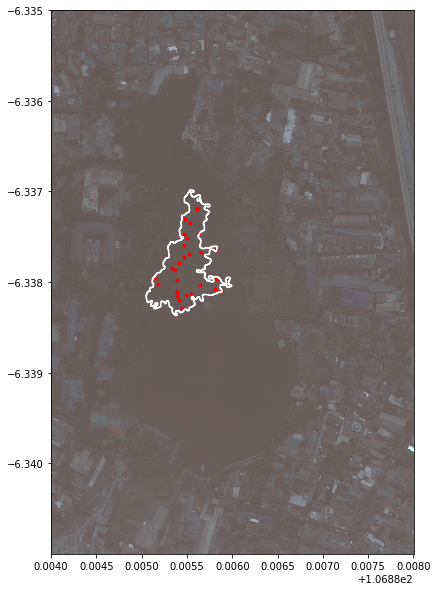

/home/daffolap-851/.conda/envs/green_city_watch_dev/lib/python3.6/site-packages/pyproj/crs.py:77: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method.
  return _prepare_from_string(" ".join(pjargs))


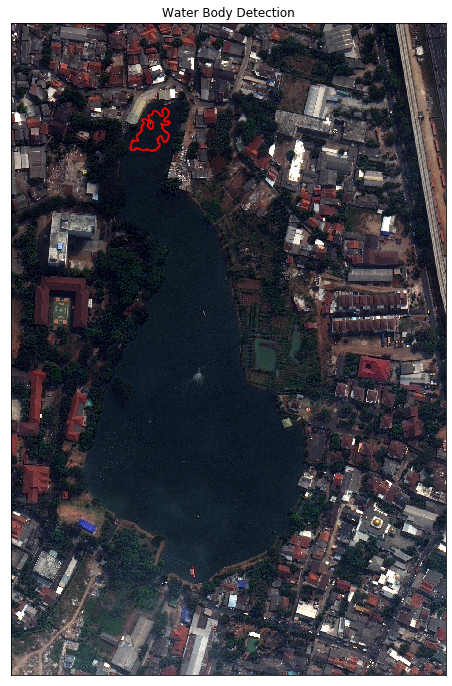

Is it water?: y/n
y


/home/daffolap-851/.conda/envs/green_city_watch_dev/lib/python3.6/site-packages/pyproj/crs.py:77: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method.
  return _prepare_from_string(" ".join(pjargs))
/home/daffolap-851/.conda/envs/green_city_watch_dev/lib/python3.6/site-packages/pyproj/crs.py:77: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method.
  return _prepare_from_string(" ".join(pjargs))
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


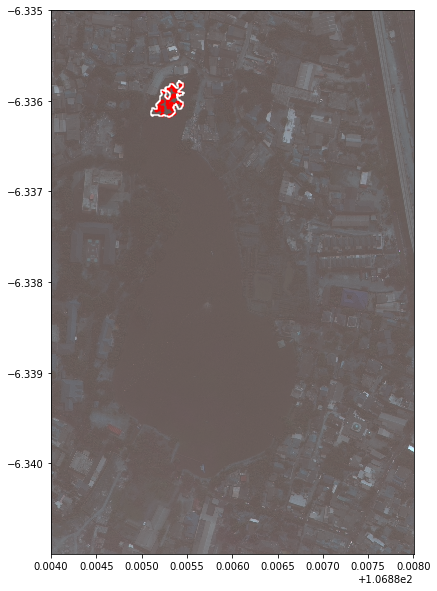


Enter the path to store the manual inference output/home/daffolap-851/Projects/GreenCityWatch/manual_inference_data_and_weights/pixel_based_training_data
Enter the path for pixel training dataset
/home/daffolap-851/Projects/GreenCityWatch/manual_inference_data_and_weights/pixel_based_training_data/user_output_3.csv
0 coastal
1 blue
2 green
3 yellow
4 red
5 red_edge
6 nir1
7 nir2
8 cloudCover
9 multiResolution
10 targetAzimuth
11 sunAzimuth
12 offNadirAngle
13 sunElevation
14 panResolution
15 ndvi
16 ndwi
17 wwi

Training Data Shape:  (914, 17)
Training Data Dtype:  float64
Training Labels Shape:  (914,)
Training Labels Dtype:  bool

Validation Data Shape:  (262, 17)
Validation Data Shape:  float64
Validation Labels:  (262,)
Validation Labels:  bool

Test Data Shape:  (130, 17)
Test Data Shape:  float64
Test Labels:  (130,)
Test Labels:  bool
Enter the path to pretrained model weight
/home/daffolap-851/Projects/GreenCityWatch/manual_inference_data_and_weights/pre_trained_model_weights/

914/914 [==============================] - 0s 16us/step - loss: 0.2443 - accuracy: 0.9322 - val_loss: 0.2138 - val_accuracy: 0.9466

Epoch 00024: accuracy did not improve from 0.93545
Epoch 25/200
914/914 [==============================] - 0s 16us/step - loss: 0.2378 - accuracy: 0.9365 - val_loss: 0.1985 - val_accuracy: 0.9427

Epoch 00025: accuracy improved from 0.93545 to 0.93654, saving model to /home/daffolap-851/Projects/GreenCityWatch/manual_inference_data_and_weights/model_weight/b71f_batchSize_200_Epoch-00025-Val_acc-0.93654_weights.hdf5
Epoch 26/200
914/914 [==============================] - 0s 16us/step - loss: 0.2201 - accuracy: 0.9387 - val_loss: 0.1883 - val_accuracy: 0.9389

Epoch 00026: accuracy improved from 0.93654 to 0.93873, saving model to /home/daffolap-851/Projects/GreenCityWatch/manual_inference_data_and_weights/model_weight/b71f_batchSize_200_Epoch-00026-Val_acc-0.93873_weights.hdf5
Epoch 27/200
914/914 [==============================] - 0s 16us/step - loss: 0.2


Epoch 00059: accuracy did not improve from 0.95186
Epoch 60/200
914/914 [==============================] - 0s 13us/step - loss: 0.1837 - accuracy: 0.9398 - val_loss: 0.1625 - val_accuracy: 0.9580

Epoch 00060: accuracy did not improve from 0.95186
Epoch 61/200
914/914 [==============================] - 0s 13us/step - loss: 0.1835 - accuracy: 0.9420 - val_loss: 0.1631 - val_accuracy: 0.9580

Epoch 00061: accuracy did not improve from 0.95186
Epoch 62/200
914/914 [==============================] - 0s 13us/step - loss: 0.1887 - accuracy: 0.9420 - val_loss: 0.1625 - val_accuracy: 0.9580

Epoch 00062: accuracy did not improve from 0.95186
Epoch 63/200
914/914 [==============================] - 0s 12us/step - loss: 0.1799 - accuracy: 0.9409 - val_loss: 0.1602 - val_accuracy: 0.9580

Epoch 00063: accuracy did not improve from 0.95186
Epoch 64/200
914/914 [==============================] - 0s 14us/step - loss: 0.1813 - accuracy: 0.9420 - val_loss: 0.1638 - val_accuracy: 0.9580

Epoch 00064: a

914/914 [==============================] - 0s 14us/step - loss: 0.1687 - accuracy: 0.9453 - val_loss: 0.1493 - val_accuracy: 0.9580

Epoch 00101: accuracy did not improve from 0.95186
Epoch 102/200
914/914 [==============================] - 0s 15us/step - loss: 0.1652 - accuracy: 0.9475 - val_loss: 0.1540 - val_accuracy: 0.9580

Epoch 00102: accuracy did not improve from 0.95186
Epoch 103/200
914/914 [==============================] - 0s 14us/step - loss: 0.1746 - accuracy: 0.9420 - val_loss: 0.1639 - val_accuracy: 0.9580

Epoch 00103: accuracy did not improve from 0.95186
Epoch 104/200
914/914 [==============================] - 0s 14us/step - loss: 0.1726 - accuracy: 0.9431 - val_loss: 0.1672 - val_accuracy: 0.9580

Epoch 00104: accuracy did not improve from 0.95186
Epoch 105/200
914/914 [==============================] - 0s 14us/step - loss: 0.1731 - accuracy: 0.9442 - val_loss: 0.1584 - val_accuracy: 0.9580

Epoch 00105: accuracy did not improve from 0.95186
Epoch 106/200
914/914 [=

914/914 [==============================] - 0s 14us/step - loss: 0.1571 - accuracy: 0.9431 - val_loss: 0.1531 - val_accuracy: 0.9580

Epoch 00142: accuracy did not improve from 0.95186
Epoch 143/200
914/914 [==============================] - 0s 13us/step - loss: 0.1596 - accuracy: 0.9420 - val_loss: 0.1598 - val_accuracy: 0.9580

Epoch 00143: accuracy did not improve from 0.95186
Epoch 144/200
914/914 [==============================] - 0s 14us/step - loss: 0.1715 - accuracy: 0.9387 - val_loss: 0.1623 - val_accuracy: 0.9542

Epoch 00144: accuracy did not improve from 0.95186
Epoch 145/200
914/914 [==============================] - 0s 14us/step - loss: 0.1560 - accuracy: 0.9475 - val_loss: 0.1565 - val_accuracy: 0.9580

Epoch 00145: accuracy did not improve from 0.95186
Epoch 146/200
914/914 [==============================] - 0s 14us/step - loss: 0.1671 - accuracy: 0.9398 - val_loss: 0.1538 - val_accuracy: 0.9580

Epoch 00146: ReduceLROnPlateau reducing learning rate to 0.0001000000047497


Epoch 00182: accuracy did not improve from 0.95186
Epoch 183/200
914/914 [==============================] - 0s 13us/step - loss: 0.1544 - accuracy: 0.9420 - val_loss: 0.1495 - val_accuracy: 0.9580

Epoch 00183: accuracy did not improve from 0.95186
Epoch 184/200
914/914 [==============================] - 0s 14us/step - loss: 0.1642 - accuracy: 0.9420 - val_loss: 0.1495 - val_accuracy: 0.9580

Epoch 00184: accuracy did not improve from 0.95186
Epoch 185/200
914/914 [==============================] - 0s 15us/step - loss: 0.1642 - accuracy: 0.9387 - val_loss: 0.1495 - val_accuracy: 0.9580

Epoch 00185: accuracy did not improve from 0.95186
Epoch 186/200
914/914 [==============================] - 0s 14us/step - loss: 0.1537 - accuracy: 0.9464 - val_loss: 0.1496 - val_accuracy: 0.9580

Epoch 00186: accuracy did not improve from 0.95186
Epoch 187/200
914/914 [==============================] - 0s 14us/step - loss: 0.1632 - accuracy: 0.9420 - val_loss: 0.1496 - val_accuracy: 0.9580

Epoch 001

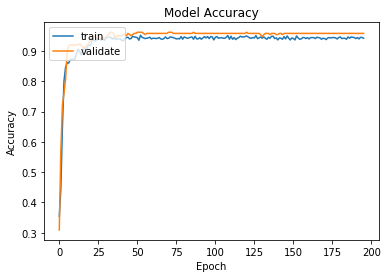

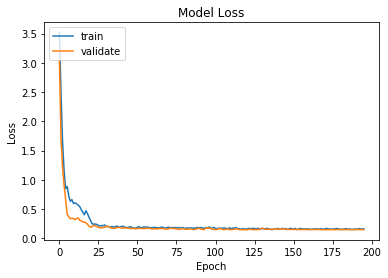

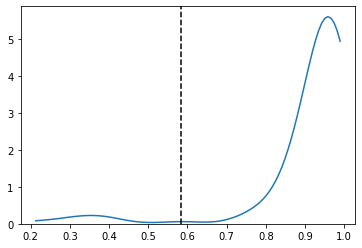

Otsu Threshold: 0.5847039
Precision Score: 0.975609756097561
Recall Score: 1.0
F1-Score: 0.9876543209876543
Accuracy: 0.9769230769230769


In [10]:
%run /home/daffolap-851/Projects/GreenCityWatch/sukh_share/notebooks/manual_inference.ipynb
accuracy = 0
while accuracy < 0.93:
    start_manual_inference()
    pixel_training_dataset_path = input("Enter the path for pixel training dataset\n").strip()
    X_train, X_validation, X_test, y_train, y_validation, y_test = prepare_the_training_dataset(pixel_training_dataset_path)
    pre_trained_model_weight = input("Enter the path to pretrained model weight\n").strip()
    output_path_to_save_model = input("Enter the path save the model weight\n").strip()
    accuracy = retrain_the_model(X_train, X_validation, X_test, y_train, y_validation, y_test, pre_trained_model_weight, output_path_to_save_model)
    
model_weight_path = '/home/daffolap-851/Projects/GreenCityWatch/manual_inference_data_and_weights/pre_trained_model_weights/bfalg_batchSize_200_Epoch-00185-Val_acc-0.95145_weights.hdf5'
raster_files_path = '/home/daffolap-851/Projects/GreenCityWatch/manual_inference_data_and_weights/img_data_to_combine/*.tif'
output_file_path = '/home/daffolap-851/Projects/GreenCityWatch/manual_inference_data_and_weights/raster_classifications/'
inference_img_file_path = '/home/daffolap-851/Projects/GreenCityWatch/manual_inference_data_and_weights/raster_classifications/classification_Setu_Babakan_N_2019-05-31_03_28_104001004CBD1F00.tif'
manual_inference_path = '/home/daffolap-851/Projects/GreenCityWatch/manual_inference_data_and_weights/pixel_based_training_data'    
pixel_training_dataset = '/home/daffolap-851/Projects/GreenCityWatch/manual_inference_data_and_weights/pixel_based_training_data/user_output_3.csv'
pre_trained_model_weight = '/home/daffolap-851/Projects/GreenCityWatch/manual_inference_data_and_weights/pre_trained_model_weights/bfalg_batchSize_200_Epoch-00185-Val_acc-0.95145_weights.hdf5'
save_model_weight_path = '/home/daffolap-851/Projects/GreenCityWatch/manual_inference_data_and_weights/model_weight'